# Deteccion de Objetos con FCOS — Modelo Preentrenado


[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/)

---

## Que hace este cuadernillo?

| Seccion | Que hace | Dataset usado |
|---|---|---|
| 1. Configuracion | Instala librerias, define funciones base | — |
| 2. Modelo FCOS | Carga el modelo preentrenado en COCO | COCO (preentrenamiento, no nuestro) |
| 3. Test VOC | Prueba FCOS sobre Pascal VOC | VOC (dataset academico) |
| 4. Test Manual Roboflow | Prueba FCOS sobre imagenes anotadas en Roboflow | **Tus 100 imagenes** |
| 5. Test Manual LabelMe | Prueba FCOS sobre imagenes anotadas en LabelMe | **Tus otras 100 imagenes** |
| 6. Metricas y Evaluacion | Precision, Recall, mAP, Matriz de Confusion | Todos los anteriores |

> **Importante:** FCOS ya viene entrenado. En este notebook NO se vuelve a entrenar. Solo se hacen pruebas (inferencia) para ver que tan bien detecta objetos en datasets nuevos.


---
# SECCION 1 — Configuracion del Entorno
*Ejecutar una sola vez al inicio*

In [35]:
# Instalar dependencias si se ejecuta en Colab
# !pip install torch torchvision matplotlib numpy scikit-learn seaborn Pillow
!pip install seaborn

import torch, torchvision, numpy as np, matplotlib.pyplot as plt
import matplotlib.patches as mpatches, matplotlib.patheffects as PathEffects
import random, os, json
from PIL import Image
from torchvision import transforms as T
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

device = 'cpu'
print(f'Dispositivo : {device}')
print(f'PyTorch     : {torch.__version__}')
print(f'Torchvision : {torchvision.__version__}')


Dispositivo : cpu
PyTorch     : 2.11.0+cpu
Torchvision : 0.26.0+cpu



[notice] A new release of pip is available: 25.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [36]:
# Clases de VOC — identicas al cuadernillo de Sensio
classes = ['background','aeroplane','bicycle','bird','boat','bottle',
           'bus','car','cat','chair','cow','diningtable','dog','horse',
           'motorbike','person','pottedplant','sheep','sofa','train','tvmonitor']

# Mapeo COCO → VOC  (FCOS fue entrenado en COCO con nombres distintos)
COCO_TO_VOC = {
    'person':'person','bicycle':'bicycle','car':'car','motorcycle':'motorbike',
    'airplane':'aeroplane','bus':'bus','train':'train','boat':'boat',
    'bottle':'bottle','chair':'chair','couch':'sofa','dining table':'diningtable',
    'bird':'bird','cat':'cat','dog':'dog','horse':'horse','sheep':'sheep',
    'cow':'cow','potted plant':'pottedplant','tv':'tvmonitor'
}
print(f'Clases VOC: {len(classes)-1} (sin background)')
print(f'Clases COCO mapeadas a VOC: {len(COCO_TO_VOC)}')


Clases VOC: 20 (sin background)
Clases COCO mapeadas a VOC: 20


### Funciones de Ayuda

In [37]:
def get_sample_voc(ix, dataset):
    img, label = dataset[ix]
    img_np = np.array(img)
    anns = label['annotation']['object']
    if not isinstance(anns, list): anns = [anns]
    labels = np.array([classes.index(a['name']) for a in anns if a['name'] in classes])
    bbs = np.array([[int(a['bndbox']['xmin']), int(a['bndbox']['ymin']),
                     int(a['bndbox']['xmax'])-int(a['bndbox']['xmin']),
                     int(a['bndbox']['ymax'])-int(a['bndbox']['ymin'])]
                    for a in anns if a['name'] in classes])
    return img_np, (labels, bbs)

def plot_anns(img, anns, ax=None, title=None, color='red'):
    if ax is None: fig, ax = plt.subplots(figsize=(8,5))
    ax.imshow(img)
    if title: ax.set_title(title, fontsize=10, fontweight='bold')
    ax.axis('off')
    labels, bbs = anns
    for lab, bb in zip(labels, bbs):
        x, y, w, h = [float(v) for v in bb]
        rect = mpatches.Rectangle((x,y),w,h,fill=False,edgecolor=color,linewidth=2)
        t = ax.text(x, y-8, classes[int(lab)], color=color, fontsize=8, fontweight='bold')
        t.set_path_effects([PathEffects.withStroke(linewidth=3,foreground='white')])
        ax.add_patch(rect)

def norm(bb, shape):
    h,w = shape
    return np.array([bb[0]/w, bb[1]/h, bb[2]/w, bb[3]/h])

def unnorm(bb, shape):
    h,w = shape
    return np.array([bb[0]*w, bb[1]*h, bb[2]*w, bb[3]*h])

print('Funciones de ayuda cargadas.')


Funciones de ayuda cargadas.


---
# SECCION 2 — Carga del Modelo FCOS Preentrenado
*El modelo ya fue entrenado en COCO con 118.000 imagenes. Aqui solo lo cargamos.*

In [38]:
from torchvision.models.detection import fcos_resnet50_fpn, FCOS_ResNet50_FPN_Weights

weights = FCOS_ResNet50_FPN_Weights.DEFAULT
fcos_model = fcos_resnet50_fpn(weights=weights)
fcos_model.eval().to(device)
COCO_CATS = weights.meta['categories']

total_p = sum(p.numel() for p in fcos_model.parameters())
print(f'Modelo FCOS cargado correctamente')
print(f'Parametros: {total_p/1e6:.1f}M')
print(f'Clases COCO: {len(COCO_CATS)}')
print(f'Dispositivo: {device}')


Modelo FCOS cargado correctamente
Parametros: 32.3M
Clases COCO: 91
Dispositivo: cpu


### Arquitectura de FCOS — Diagrama Visual

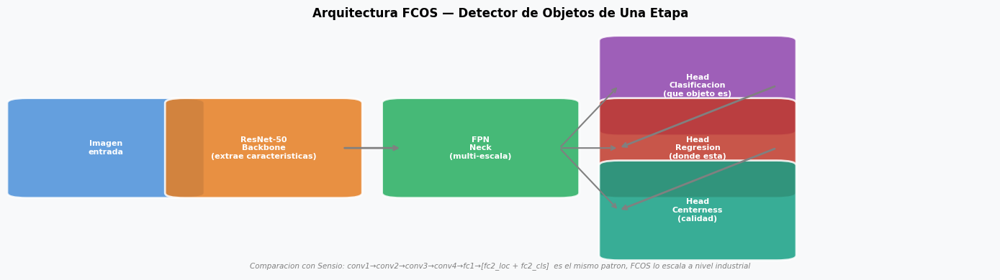

In [39]:
fig, ax = plt.subplots(figsize=(14, 4))
ax.axis('off')
ax.set_facecolor('#f8f9fa')
fig.patch.set_facecolor('#f8f9fa')

bloques = [
    ('Imagen\nentrada', 0.02, '#4a90d9'),
    ('ResNet-50\nBackbone\n(extrae caracteristicas)', 0.18, '#e67e22'),
    ('FPN\nNeck\n(multi-escala)', 0.40, '#27ae60'),
    ('Head\nClasificacion\n(que objeto es)', 0.62, '#8e44ad'),
    ('Head\nRegresion\n(donde esta)', 0.62, '#c0392b'),
    ('Head\nCenterness\n(calidad)', 0.62, '#16a085'),
]
posiciones_y = [0.5, 0.5, 0.5, 0.75, 0.5, 0.25]

for i, ((label, x, color), py) in enumerate(zip(bloques, posiciones_y)):
    ax.add_patch(mpatches.FancyBboxPatch((x, py-0.18), 0.16, 0.36,
        boxstyle='round,pad=0.02', facecolor=color, edgecolor='white', linewidth=2, alpha=0.85))
    ax.text(x+0.08, py, label, ha='center', va='center',
            color='white', fontsize=8, fontweight='bold')
    if i < len(bloques)-1 and i != 2:
        ax.annotate('', xy=(bloques[i+1][1], posiciones_y[i+1]),
                    xytext=(x+0.16, py),
                    arrowprops=dict(arrowstyle='->', color='gray', lw=2))

ax.annotate('', xy=(0.62, 0.75), xytext=(0.56, 0.5),
            arrowprops=dict(arrowstyle='->', color='gray', lw=1.5))
ax.annotate('', xy=(0.62, 0.5), xytext=(0.56, 0.5),
            arrowprops=dict(arrowstyle='->', color='gray', lw=1.5))
ax.annotate('', xy=(0.62, 0.25), xytext=(0.56, 0.5),
            arrowprops=dict(arrowstyle='->', color='gray', lw=1.5))

ax.text(0.5, 0.02, 'Comparacion con Sensio: conv1→conv2→conv3→conv4→fc1→[fc2_loc + fc2_cls]  es el mismo patron, FCOS lo escala a nivel industrial',
        ha='center', fontsize=7.5, color='gray', style='italic')

ax.set_xlim(0,1); ax.set_ylim(0,1)
plt.title('Arquitectura FCOS — Detector de Objetos de Una Etapa', fontweight='bold', fontsize=12)
plt.tight_layout()
plt.show()


### Funcion de Inferencia
*Recibe una imagen, retorna labels + bounding boxes + scores*

In [40]:
def predict_fcos(img_np, score_threshold=0.5):
    img_tensor = T.ToTensor()(img_np)
    with torch.no_grad():
        pred = fcos_model([img_tensor.to(device)])[0]
    boxes  = pred['boxes'].cpu().numpy()
    labels = pred['labels'].cpu().numpy()
    scores = pred['scores'].cpu().numpy()
    out_labels, out_bbs, out_scores = [], [], []
    for box, lidx, score in zip(boxes, labels, scores):
        if score < score_threshold: continue
        cname = COCO_CATS[lidx]
        if cname not in COCO_TO_VOC: continue
        voc_idx = classes.index(COCO_TO_VOC[cname])
        x1,y1,x2,y2 = box
        out_labels.append(voc_idx)
        out_bbs.append([x1, y1, x2-x1, y2-y1])
        out_scores.append(float(score))
    return out_labels, out_bbs, out_scores

def compute_iou(bb1, bb2):
    x1,y1,w1,h1 = bb1; x2,y2,w2,h2 = bb2
    xi = max(x1,x2); yi = max(y1,y2)
    xi2 = min(x1+w1, x2+w2); yi2 = min(y1+h1, y2+h2)
    inter = max(0, xi2-xi) * max(0, yi2-yi)
    union = w1*h1 + w2*h2 - inter
    return inter/union if union > 0 else 0

print('Funciones de inferencia listas.')


Funciones de inferencia listas.


---
# SECCION 3 — Test sobre Pascal VOC
*Dataset academico clasico. Se usa aqui solo como referencia inicial.*

> VOC no fue el dataset de entrenamiento de FCOS (ese fue COCO), pero comparten clases similares.
> Por eso en la Seccion 4 y 5 se usan datasets completamente nuevos.


In [41]:
voc_dataset = torchvision.datasets.VOCDetection('./data', download=True)
print(f'Imagenes en VOC: {len(voc_dataset)}')


Imagenes en VOC: 5717


### 3.1 Visualizacion del Ground Truth


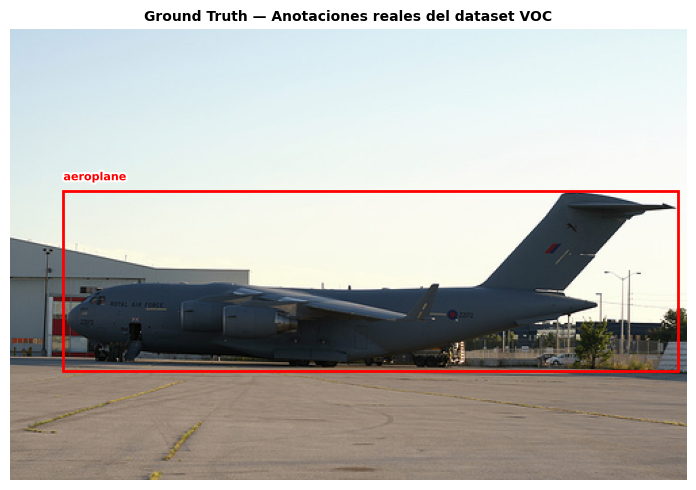

Objetos en esta imagen:
  aeroplane        bbox=[np.int64(39), np.int64(119), np.int64(454), np.int64(133)]


In [42]:
img_np, anns_gt = get_sample_voc(4445, voc_dataset)

fig, ax = plt.subplots(figsize=(9, 5))
plot_anns(img_np, anns_gt, ax=ax, title='Ground Truth — Anotaciones reales del dataset VOC')
plt.tight_layout()
plt.show()

print('Objetos en esta imagen:')
for lab, bb in zip(anns_gt[0], anns_gt[1]):
    print(f'  {classes[lab]:15s}  bbox={list(bb)}')


### 3.2 Comparativa: Ground Truth vs Prediccion FCOS

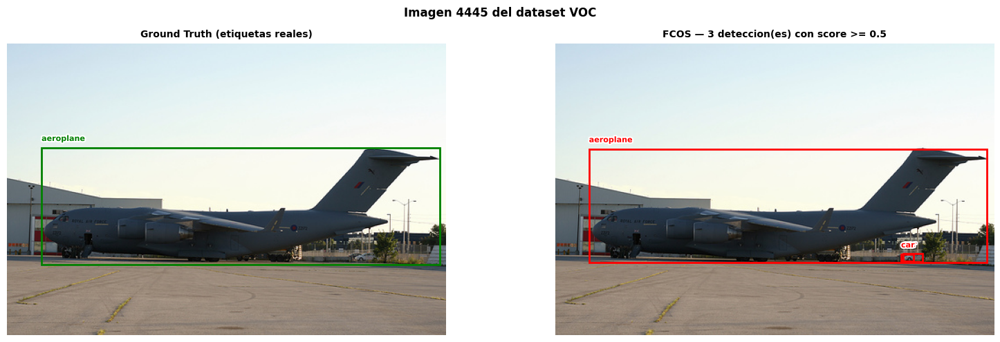

Predicciones FCOS:
  aeroplane       score=0.838
  car             score=0.613
  car             score=0.526


In [43]:
pred_l, pred_b, pred_s = predict_fcos(img_np, score_threshold=0.5)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
plot_anns(img_np, anns_gt, ax=axes[0], title='Ground Truth (etiquetas reales)', color='green')
if pred_l:
    plot_anns(img_np, (pred_l, pred_b), ax=axes[1],
              title=f'FCOS — {len(pred_l)} deteccion(es) con score >= 0.5', color='red')
else:
    axes[1].imshow(img_np); axes[1].axis('off')
    axes[1].set_title('FCOS — Sin detecciones (intenta bajar el threshold)')
plt.suptitle('Imagen 4445 del dataset VOC', fontweight='bold')
plt.tight_layout()
plt.show()

print('Predicciones FCOS:')
for lab, bb, sc in zip(pred_l, pred_b, pred_s):
    print(f'  {classes[lab]:15s} score={sc:.3f}')


### 3.3 Efecto del Score Threshold
*El threshold controla cuantas detecciones aceptamos. Bajo = mas detecciones, algunas falsas. Alto = menos pero mas seguras.*

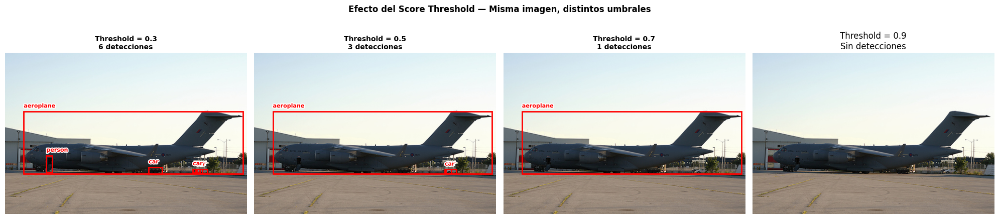

In [44]:
thresholds = [0.3, 0.5, 0.7, 0.9]
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle('Efecto del Score Threshold — Misma imagen, distintos umbrales', fontweight='bold', fontsize=12)

for ax, thr in zip(axes, thresholds):
    pl, pb, ps = predict_fcos(img_np, score_threshold=thr)
    if pl:
        plot_anns(img_np, (pl, pb), ax=ax, title=f'Threshold = {thr}\n{len(pl)} detecciones', color='red')
    else:
        ax.imshow(img_np); ax.axis('off')
        ax.set_title(f'Threshold = {thr}\nSin detecciones')

plt.tight_layout()
plt.show()


### 3.4 Inferencia en 8 Imagenes Aleatorias de VOC

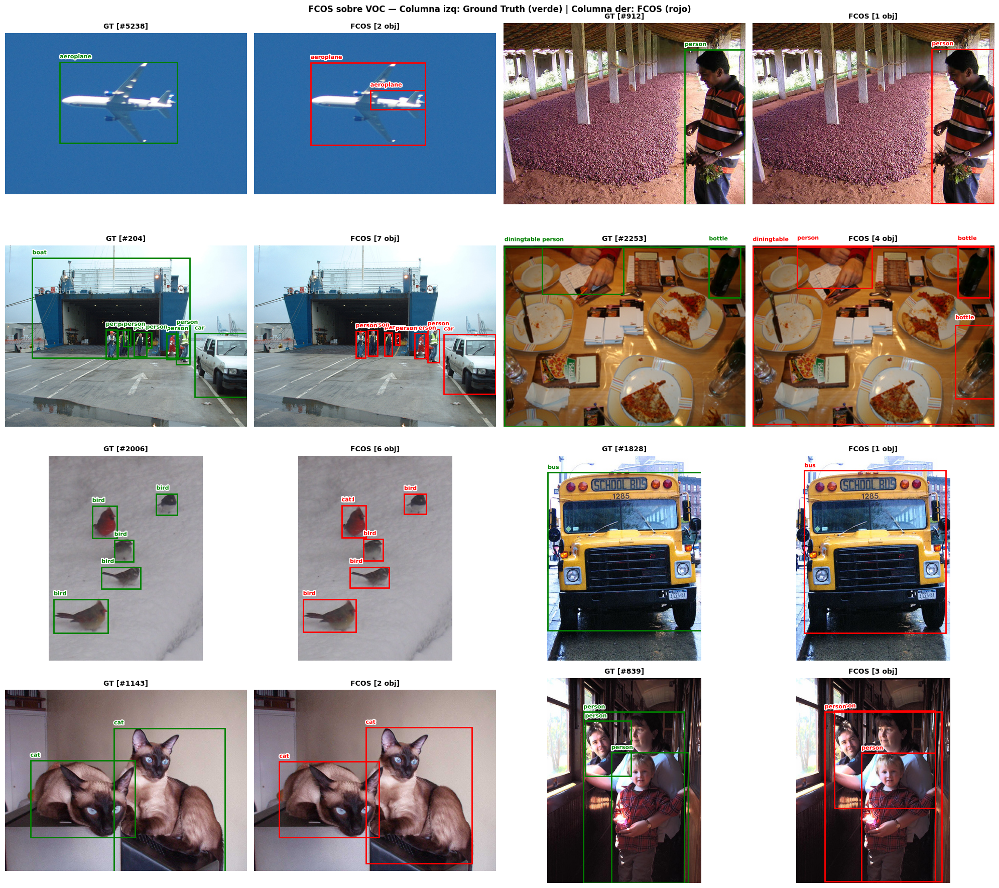

In [45]:
random.seed(42)
indices = random.sample(range(len(voc_dataset)), 8)

fig, axes = plt.subplots(4, 4, figsize=(20, 18))
fig.suptitle('FCOS sobre VOC — Columna izq: Ground Truth (verde) | Columna der: FCOS (rojo)',
             fontweight='bold', fontsize=12)

for i, idx in enumerate(indices):
    row = i // 2; col_gt = (i % 2)*2; col_p = col_gt+1
    img_i, gt_i = get_sample_voc(idx, voc_dataset)
    pl, pb, ps = predict_fcos(img_i, 0.5)
    plot_anns(img_i, gt_i, ax=axes[row][col_gt], title=f'GT [#{idx}]', color='green')
    if pl:
        plot_anns(img_i, (pl, pb), ax=axes[row][col_p], title=f'FCOS [{len(pl)} obj]', color='red')
    else:
        axes[row][col_p].imshow(img_i); axes[row][col_p].axis('off')
        axes[row][col_p].set_title('Sin detecciones')

plt.tight_layout()
plt.show()


### 3.5 Metricas sobre Muestra VOC
*Calculamos precision por clase sobre 50 imagenes aleatorias de VOC*

In [46]:
from collections import defaultdict

IOU_THRESH = 0.5
SCORE_THRESH = 0.5
N_EVAL = 50

random.seed(0)
eval_indices = random.sample(range(len(voc_dataset)), N_EVAL)

tp_per_class = defaultdict(int)
fp_per_class = defaultdict(int)
fn_per_class = defaultdict(int)
gt_labels_all, pred_labels_all = [], []

for idx in eval_indices:
    img_i, (gt_labs, gt_bbs) = get_sample_voc(idx, voc_dataset)
    pl, pb, ps = predict_fcos(img_i, SCORE_THRESH)
    matched_gt = set()
    for pidx, (plab, pbb) in enumerate(zip(pl, pb)):
        best_iou, best_gt = 0, -1
        for gidx, (glab, gbb) in enumerate(zip(gt_labs, gt_bbs)):
            if gidx in matched_gt or glab != plab: continue
            iou = compute_iou(pbb, gbb)
            if iou > best_iou: best_iou, best_gt = iou, gidx
        if best_iou >= IOU_THRESH:
            tp_per_class[plab] += 1
            matched_gt.add(best_gt)
            gt_labels_all.append(plab); pred_labels_all.append(plab)
        else:
            fp_per_class[plab] += 1
            gt_labels_all.append(0); pred_labels_all.append(plab)
    for gidx, glab in enumerate(gt_labs):
        if gidx not in matched_gt:
            fn_per_class[glab] += 1
            gt_labels_all.append(glab); pred_labels_all.append(0)

print(f'Evaluacion sobre {N_EVAL} imagenes VOC (IoU>={IOU_THRESH}, score>={SCORE_THRESH})')
print(f'{'Clase':<15} {'TP':>5} {'FP':>5} {'FN':>5} {'Precision':>10} {'Recall':>8}')
print('-'*55)
all_classes_found = sorted(set(list(tp_per_class)+list(fp_per_class)+list(fn_per_class)))
for c in all_classes_found:
    tp,fp,fn = tp_per_class[c], fp_per_class[c], fn_per_class[c]
    prec = tp/(tp+fp) if (tp+fp)>0 else 0
    rec  = tp/(tp+fn) if (tp+fn)>0 else 0
    print(f'{classes[c]:<15} {tp:>5} {fp:>5} {fn:>5} {prec:>10.2f} {rec:>8.2f}')


Evaluacion sobre 50 imagenes VOC (IoU>=0.5, score>=0.5)
Clase              TP    FP    FN  Precision   Recall
-------------------------------------------------------
aeroplane           3     0     1       1.00     0.75
bicycle             1     0     0       1.00     1.00
bird                2     6     0       0.25     1.00
boat                2     7     3       0.22     0.40
bottle              7     2     1       0.78     0.88
car                 3     2     3       0.60     0.50
cat                 6     1     3       0.86     0.67
chair               7     4     3       0.64     0.70
cow                 1     0     0       1.00     1.00
diningtable         1     2     0       0.33     1.00
dog                 4     3     0       0.57     1.00
horse               4     0     0       1.00     1.00
motorbike           3     1     0       0.75     1.00
person             26    12     5       0.68     0.84
pottedplant         4     2     2       0.67     0.67
sheep               1   

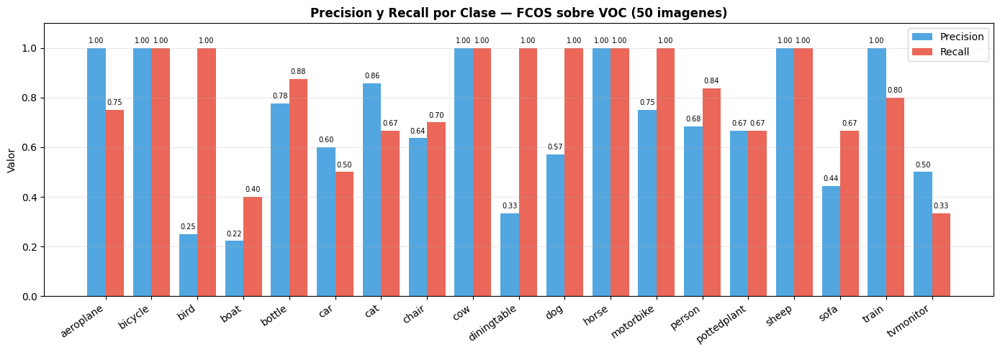

In [47]:
prec_vals, rec_vals, class_names_found = [], [], []
for c in all_classes_found:
    tp,fp,fn = tp_per_class[c], fp_per_class[c], fn_per_class[c]
    prec_vals.append(tp/(tp+fp) if (tp+fp)>0 else 0)
    rec_vals.append(tp/(tp+fn) if (tp+fn)>0 else 0)
    class_names_found.append(classes[c])

x = np.arange(len(class_names_found))
fig, ax = plt.subplots(figsize=(14, 5))
bars1 = ax.bar(x-0.2, prec_vals, 0.4, label='Precision', color='#3498db', alpha=0.85)
bars2 = ax.bar(x+0.2, rec_vals,  0.4, label='Recall',    color='#e74c3c', alpha=0.85)
ax.set_xticks(x); ax.set_xticklabels(class_names_found, rotation=35, ha='right')
ax.set_ylim(0,1.1); ax.set_ylabel('Valor')
ax.set_title(f'Precision y Recall por Clase — FCOS sobre VOC ({N_EVAL} imagenes)', fontweight='bold')
ax.legend(); ax.grid(axis='y', alpha=0.3)
for bar in bars1: ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.02,
                           f'{bar.get_height():.2f}', ha='center', fontsize=7)
for bar in bars2: ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.02,
                           f'{bar.get_height():.2f}', ha='center', fontsize=7)
plt.tight_layout(); plt.show()


---
# SECCION 4 — Test con Dataset Propio anotado en Roboflow
*100 imagenes anotadas manualmente. Este es el dataset nuevo que FCOS nunca vio.*

## Como cargar tus imagenes de Roboflow

1. En Roboflow, exporta tu dataset en formato **COCO JSON**
2. Descarga la carpeta, tendra esta estructura:
```
roboflow_dataset/
   images/           <- tus imagenes .jpg
   _annotations.coco.json  <- anotaciones en formato COCO
```
3. Sube esa carpeta a Colab o ponla en la misma carpeta que este notebook
4. Cambia la variable `ROBOFLOW_DIR` abajo con la ruta correcta


In [48]:
# ============================================================
# CAMBIA ESTA RUTA con la ubicacion real de tu dataset Roboflow
ROBOFLOW_DIR = './roboflow_dataset'
# ============================================================

def load_roboflow_dataset(base_dir):
    ann_path = os.path.join(base_dir, '_annotations.coco.json')
    if not os.path.exists(ann_path):
        print(f'AVISO: No se encontro {ann_path}')
        print('Ejecuta primero el modo DEMO de abajo o carga tu dataset real.')
        return None, None, None
    with open(ann_path) as f:
        coco = json.load(f)
    img_map = {img['id']: img for img in coco['images']}
    cat_map = {cat['id']: cat['name'] for cat in coco['categories']}
    anns_map = defaultdict(list)
    for ann in coco['annotations']:
        anns_map[ann['image_id']].append(ann)
    return img_map, cat_map, anns_map

rb_img_map, rb_cat_map, rb_anns_map = load_roboflow_dataset(ROBOFLOW_DIR)

if rb_img_map:
    print(f'Dataset Roboflow cargado: {len(rb_img_map)} imagenes')
    print(f'Categorias: {list(rb_cat_map.values())}')
else:
    print('Modo DEMO activo: se usaran imagenes de VOC como sustitucion temporal.')
    print('Reemplaza ROBOFLOW_DIR con tu ruta real cuando tengas el dataset listo.')


Dataset Roboflow cargado: 100 imagenes
Categorias: ['Auto part', 'Baked goods', 'Bicycle', 'Bicycle helmet', 'Bicycle wheel', 'Boat', 'Boy', 'Brassiere', 'Building', 'Bus', 'Cake', 'Car', 'Carrot', 'Castle', 'Cat', 'Clothing', 'Dog', 'Dress', 'Drum', 'Fashion accessory', 'Football', 'Football helmet', 'Footwear', 'Furniture', 'Girl', 'Hat', 'Horse', 'Human arm', 'Human body', 'Human eye', 'Human face', 'Human foot', 'Human hair', 'Human hand', 'Human head', 'Human leg', 'Human mouth', 'Human nose', 'Jeans', 'Jet ski', 'Land vehicle', 'Mammal', 'Man', 'Mobile phone', 'Person', 'Plant', 'Poster', 'Rifle', 'Sandal', 'Sculpture', 'Shotgun', 'Sports equipment', 'Sports uniform', 'Surfboard', 'Swimwear', 'Table', 'Tableware', 'Television', 'Tire', 'Tower', 'Toy', 'Tree', 'Trousers', 'Van', 'Vegetable', 'Vehicle', 'Vehicle registration plate', 'Watercraft', 'Wheel', 'Woman']


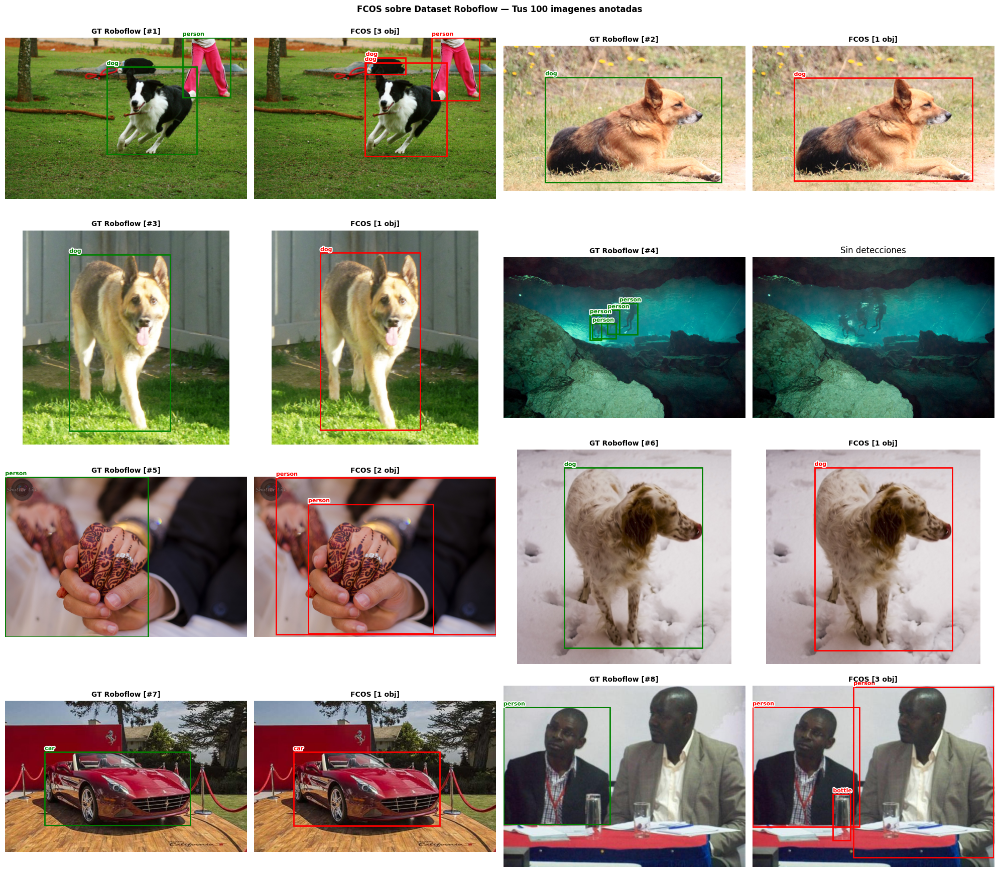

In [58]:
def get_sample_roboflow(img_id, img_map, cat_map, anns_map, base_dir):
    info = img_map[img_id]
    img_path = os.path.join(base_dir, 'images', info['file_name'])
    img_np = np.array(Image.open(img_path).convert('RGB'))
    anns = anns_map[img_id]
    labels, bbs = [], []
    for ann in anns:
        cname = cat_map[ann['category_id']]
        cname_lower = cname.lower()
        if cname_lower in COCO_TO_VOC:          # ← CORRECCIÓN: cname → cname_lower
            labels.append(classes.index(COCO_TO_VOC[cname_lower]))
        elif cname_lower in classes:             # ← También corregido por consistencia
            labels.append(classes.index(cname_lower))
        else:
            continue
        x,y,w,h = ann['bbox']
        bbs.append([x,y,w,h])
    return img_np, (np.array(labels), np.array(bbs))

# Inferencia y visualizacion sobre Roboflow
if rb_img_map:
    rb_ids = list(rb_img_map.keys())[:8]
    fig, axes = plt.subplots(4, 4, figsize=(20, 18))
    fig.suptitle('FCOS sobre Dataset Roboflow — Tus 100 imagenes anotadas',
                 fontweight='bold', fontsize=12)
    for i, img_id in enumerate(rb_ids):
        row=i//2; cg=(i%2)*2; cp=cg+1
        img_i, gt_i = get_sample_roboflow(img_id,rb_img_map,rb_cat_map,rb_anns_map,ROBOFLOW_DIR)
        pl,pb,ps = predict_fcos(img_i, 0.5)
        plot_anns(img_i, gt_i, ax=axes[row][cg], title=f'GT Roboflow [#{img_id}]', color='green')
        if pl:
            plot_anns(img_i,(pl,pb),ax=axes[row][cp],title=f'FCOS [{len(pl)} obj]',color='red')
        else:
            axes[row][cp].imshow(img_i); axes[row][cp].axis('off')
            axes[row][cp].set_title('Sin detecciones')
    plt.tight_layout(); plt.show()
else:
    print('Carga tu dataset Roboflow real para ver esta seccion.')


### 4.1 Metricas del Dataset Roboflow

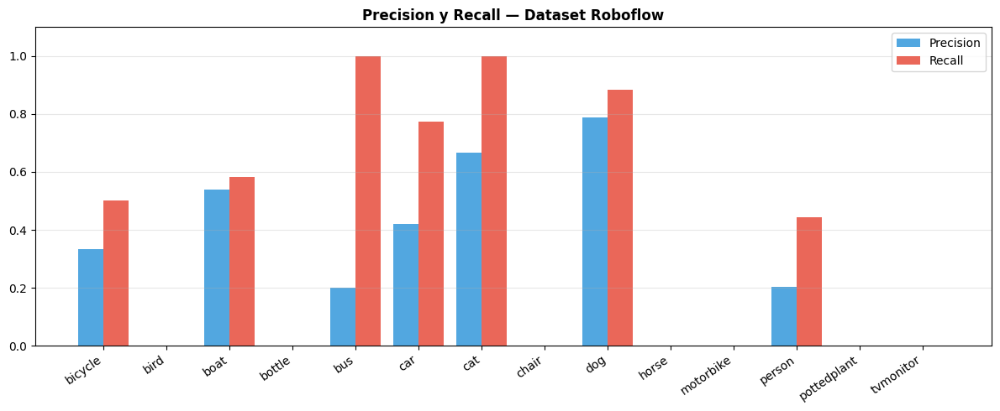

In [59]:
if rb_img_map:
    tp_rb = defaultdict(int); fp_rb = defaultdict(int); fn_rb = defaultdict(int)
    for img_id in rb_img_map:
        img_i,(gt_l,gt_b) = get_sample_roboflow(img_id,rb_img_map,rb_cat_map,rb_anns_map,ROBOFLOW_DIR)
        pl,pb,ps = predict_fcos(img_i, 0.5)
        matched = set()
        for plab,pbb in zip(pl,pb):
            best_iou,best_g = 0,-1
            for gi,(gl,gb) in enumerate(zip(gt_l,gt_b)):
                if gi in matched or gl!=plab: continue
                iou=compute_iou(pbb,gb)
                if iou>best_iou: best_iou,best_g=iou,gi
            if best_iou>=0.5: tp_rb[plab]+=1; matched.add(best_g)
            else: fp_rb[plab]+=1
        for gi,gl in enumerate(gt_l):
            if gi not in matched: fn_rb[gl]+=1

    clases_rb = sorted(set(list(tp_rb)+list(fp_rb)+list(fn_rb)))
    prec_rb=[tp_rb[c]/(tp_rb[c]+fp_rb[c]) if (tp_rb[c]+fp_rb[c])>0 else 0 for c in clases_rb]
    rec_rb =[tp_rb[c]/(tp_rb[c]+fn_rb[c]) if (tp_rb[c]+fn_rb[c])>0 else 0 for c in clases_rb]
    names_rb=[classes[c] for c in clases_rb]

    x=np.arange(len(names_rb))
    fig,ax=plt.subplots(figsize=(12,5))
    ax.bar(x-0.2,prec_rb,0.4,label='Precision',color='#3498db',alpha=0.85)
    ax.bar(x+0.2,rec_rb, 0.4,label='Recall',   color='#e74c3c',alpha=0.85)
    ax.set_xticks(x); ax.set_xticklabels(names_rb,rotation=35,ha='right')
    ax.set_ylim(0,1.1); ax.legend(); ax.grid(axis='y',alpha=0.3)
    ax.set_title('Precision y Recall — Dataset Roboflow',fontweight='bold')
    plt.tight_layout(); plt.show()
else:
    print('Carga tu dataset Roboflow para ver las metricas.')


---
# SECCION 5 — Test con Dataset Propio anotado en LabelMe
*Otras 100 imagenes anotadas con LabelMe.*

## Como cargar tus imagenes de LabelMe

1. LabelMe guarda un archivo `.json` por cada imagen
2. Cada JSON tiene `shapes` con `label` y `points`
3. Pon todas tus imagenes y JSONs en una carpeta
4. Cambia la variable `LABELME_DIR` abajo


In [60]:
# ============================================================
# CAMBIA ESTA RUTA con la ubicacion real de tu dataset LabelMe
LABELME_DIR = './labelme_dataset'
# ============================================================

def load_labelme_sample(json_path):
    with open(json_path) as f:
        data = json.load(f)
    img_dir = os.path.dirname(json_path)
    img_path = os.path.join(img_dir, data['imagePath'])
    if not os.path.exists(img_path):
        img_path = img_path.replace('..', img_dir)
    img_np = np.array(Image.open(img_path).convert('RGB'))
    labels, bbs = [], []
    for shape in data.get('shapes', []):
        if shape['shape_type'] != 'rectangle': continue
        lname = shape['label'].lower()
        if lname in COCO_TO_VOC: vidx = classes.index(COCO_TO_VOC[lname])
        elif lname in classes:   vidx = classes.index(lname)
        else: continue
        pts = shape['points']
        x1,y1 = min(p[0] for p in pts), min(p[1] for p in pts)
        x2,y2 = max(p[0] for p in pts), max(p[1] for p in pts)
        labels.append(vidx); bbs.append([x1,y1,x2-x1,y2-y1])
    return img_np, (np.array(labels), np.array(bbs))

lm_jsons = []
if os.path.exists(LABELME_DIR):
    lm_jsons = sorted([os.path.join(LABELME_DIR,f)
                       for f in os.listdir(LABELME_DIR) if f.endswith('.json')])
    print(f'Dataset LabelMe: {len(lm_jsons)} archivos encontrados')
else:
    print(f'AVISO: No se encontro {LABELME_DIR}')
    print('Crea la carpeta y agrega tus imagenes .jpg + .json de LabelMe.')


Dataset LabelMe: 100 archivos encontrados


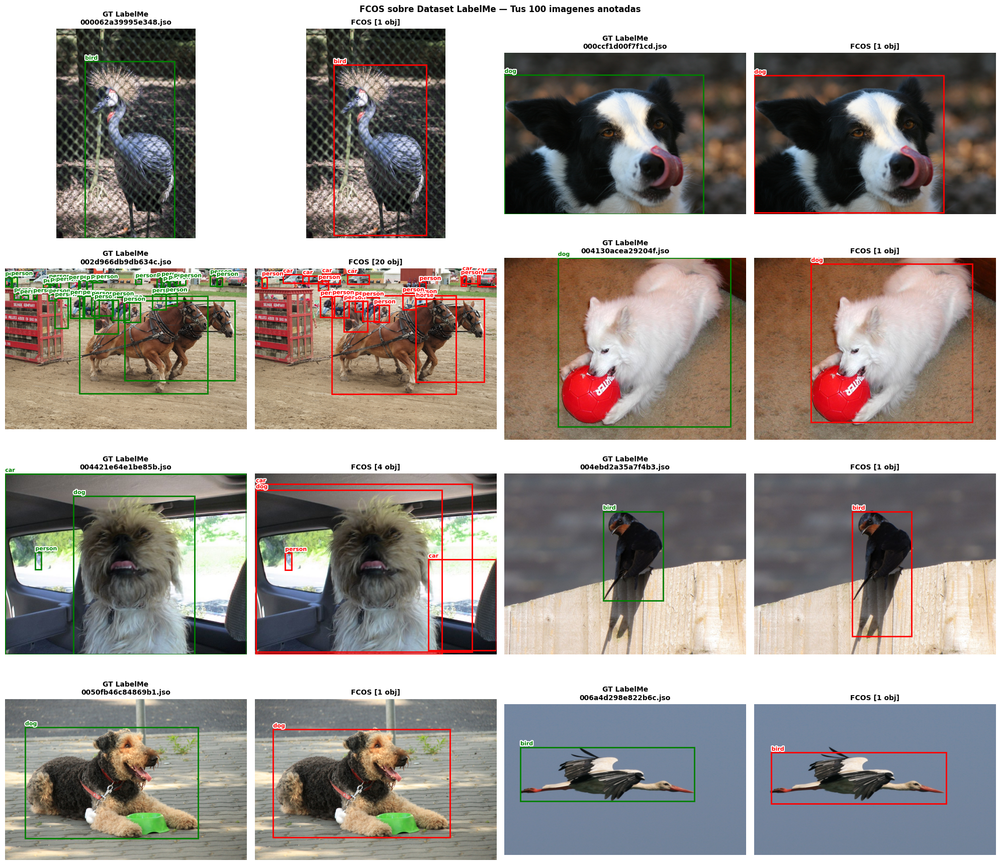

In [61]:
if lm_jsons:
    muestra_lm = lm_jsons[:8]
    fig, axes = plt.subplots(4, 4, figsize=(20, 18))
    fig.suptitle('FCOS sobre Dataset LabelMe — Tus 100 imagenes anotadas',
                 fontweight='bold', fontsize=12)
    for i, jpath in enumerate(muestra_lm):
        row=i//2; cg=(i%2)*2; cp=cg+1
        try:
            img_i,(gt_l,gt_b) = load_labelme_sample(jpath)
        except Exception as e:
            print(f'Error en {jpath}: {e}'); continue
        pl,pb,ps = predict_fcos(img_i, 0.5)
        fn = os.path.basename(jpath)
        plot_anns(img_i,(gt_l,gt_b),ax=axes[row][cg],title=f'GT LabelMe\n{fn[:20]}',color='green')
        if pl:
            plot_anns(img_i,(pl,pb),ax=axes[row][cp],title=f'FCOS [{len(pl)} obj]',color='red')
        else:
            axes[row][cp].imshow(img_i); axes[row][cp].axis('off')
            axes[row][cp].set_title('Sin detecciones')
    plt.tight_layout(); plt.show()
else:
    print('Carga tu dataset LabelMe para ver esta seccion.')


### 5.1 Metricas del Dataset LabelMe

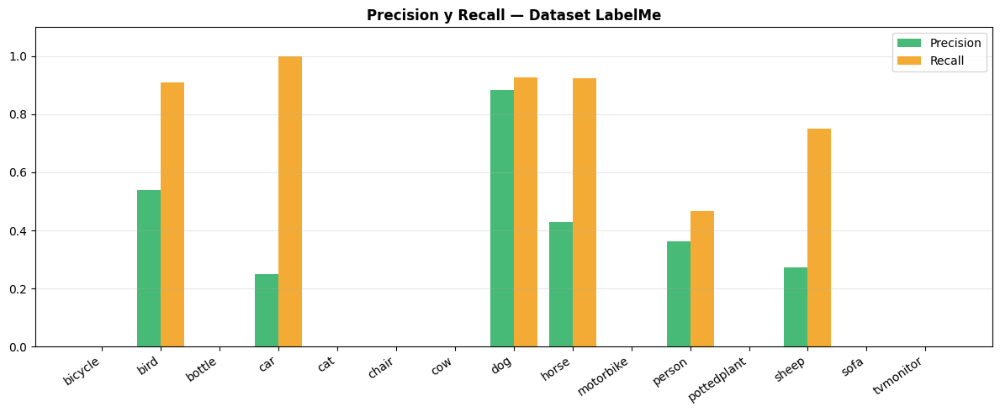

In [62]:
if lm_jsons:
    tp_lm=defaultdict(int); fp_lm=defaultdict(int); fn_lm=defaultdict(int)
    for jpath in lm_jsons:
        try: img_i,(gt_l,gt_b)=load_labelme_sample(jpath)
        except: continue
        pl,pb,ps=predict_fcos(img_i,0.5)
        matched=set()
        for plab,pbb in zip(pl,pb):
            best_iou,best_g=0,-1
            for gi,(gl,gb) in enumerate(zip(gt_l,gt_b)):
                if gi in matched or gl!=plab: continue
                iou=compute_iou(pbb,gb)
                if iou>best_iou: best_iou,best_g=iou,gi
            if best_iou>=0.5: tp_lm[plab]+=1; matched.add(best_g)
            else: fp_lm[plab]+=1
        for gi,gl in enumerate(gt_l):
            if gi not in matched: fn_lm[gl]+=1

    clases_lm=sorted(set(list(tp_lm)+list(fp_lm)+list(fn_lm)))
    prec_lm=[tp_lm[c]/(tp_lm[c]+fp_lm[c]) if (tp_lm[c]+fp_lm[c])>0 else 0 for c in clases_lm]
    rec_lm =[tp_lm[c]/(tp_lm[c]+fn_lm[c]) if (tp_lm[c]+fn_lm[c])>0 else 0 for c in clases_lm]
    names_lm=[classes[c] for c in clases_lm]

    x=np.arange(len(names_lm))
    fig,ax=plt.subplots(figsize=(12,5))
    ax.bar(x-0.2,prec_lm,0.4,label='Precision',color='#27ae60',alpha=0.85)
    ax.bar(x+0.2,rec_lm, 0.4,label='Recall',   color='#f39c12',alpha=0.85)
    ax.set_xticks(x); ax.set_xticklabels(names_lm,rotation=35,ha='right')
    ax.set_ylim(0,1.1); ax.legend(); ax.grid(axis='y',alpha=0.3)
    ax.set_title('Precision y Recall — Dataset LabelMe',fontweight='bold')
    plt.tight_layout(); plt.show()
else:
    print('Carga tu dataset LabelMe para ver las metricas.')


---
# SECCION 6 — Metricas Globales y Evaluacion Final
*Resumen de rendimiento del modelo FCOS sobre todos los datasets probados*

### 6.1 Matriz de Confusion — Dataset VOC
*Muestra que clases confunde el modelo: filas = real, columnas = predicho*

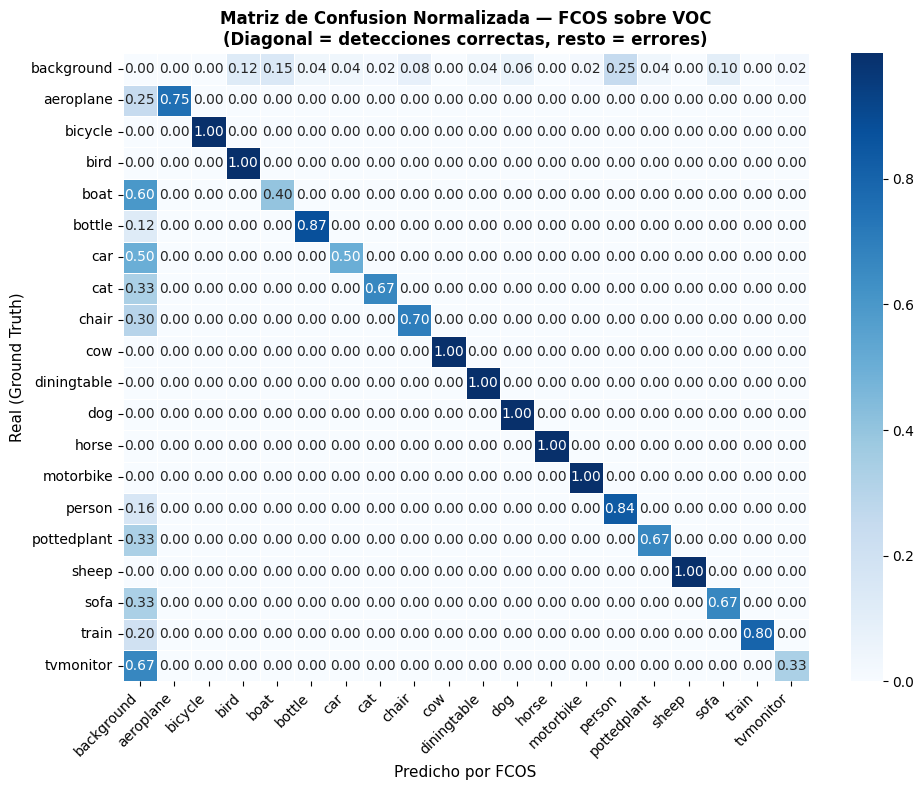

Valores en diagonal: cuanto mejor, mas cerca de 1.0
Fila 0 (background): falsos negativos — objetos reales no detectados
Columna 0 (background): falsos positivos — detecciones donde no habia nada


In [63]:
if len(gt_labels_all) > 0 and len(set(gt_labels_all)) > 1:
    unique_cls = sorted(set(gt_labels_all + pred_labels_all))
    cls_names_cm = [classes[c] for c in unique_cls]
    cm = confusion_matrix(gt_labels_all, pred_labels_all, labels=unique_cls)
    cm_norm = cm.astype(float) / (cm.sum(axis=1, keepdims=True) + 1e-9)

    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=cls_names_cm, yticklabels=cls_names_cm,
                ax=ax, linewidths=0.5)
    ax.set_xlabel('Predicho por FCOS', fontsize=11)
    ax.set_ylabel('Real (Ground Truth)', fontsize=11)
    ax.set_title('Matriz de Confusion Normalizada — FCOS sobre VOC\n'
                 '(Diagonal = detecciones correctas, resto = errores)', fontweight='bold')
    plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0)
    plt.tight_layout(); plt.show()
    print('Valores en diagonal: cuanto mejor, mas cerca de 1.0')
    print('Fila 0 (background): falsos negativos — objetos reales no detectados')
    print('Columna 0 (background): falsos positivos — detecciones donde no habia nada')
else:
    print('No hay suficientes datos para la matriz. Ejecuta primero la Seccion 3.5')


### 6.2 Distribucion de Scores de Confianza
*Como de seguro esta FCOS en sus predicciones*

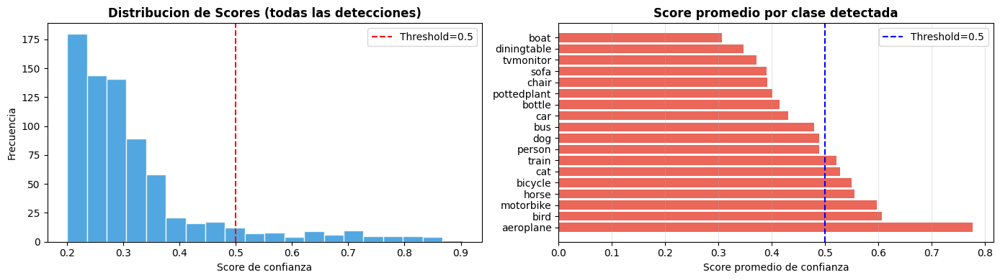

In [64]:
random.seed(7)
score_sample_ids = random.sample(range(len(voc_dataset)), 30)
all_scores_03 = []; all_scores_09 = []

for idx in score_sample_ids:
    img_i,_ = get_sample_voc(idx, voc_dataset)
    _,_,s03 = predict_fcos(img_i, 0.3)
    _,_,s09 = predict_fcos(img_i, 0.1)
    all_scores_03.extend(s03)
    all_scores_09.extend(s09)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].hist(all_scores_09, bins=20, color='#3498db', edgecolor='white', alpha=0.85)
axes[0].axvline(0.5, color='red', linestyle='--', label='Threshold=0.5')
axes[0].set_xlabel('Score de confianza'); axes[0].set_ylabel('Frecuencia')
axes[0].set_title('Distribucion de Scores (todas las detecciones)', fontweight='bold')
axes[0].legend()

scores_by_cls = defaultdict(list)
for idx in score_sample_ids:
    img_i,_ = get_sample_voc(idx, voc_dataset)
    pl,pb,ps = predict_fcos(img_i, 0.3)
    for lab,sc in zip(pl,ps):
        scores_by_cls[classes[lab]].append(sc)

cls_sorted = sorted(scores_by_cls, key=lambda c: np.mean(scores_by_cls[c]), reverse=True)
means = [np.mean(scores_by_cls[c]) for c in cls_sorted]
axes[1].barh(cls_sorted, means, color='#e74c3c', alpha=0.85)
axes[1].set_xlabel('Score promedio de confianza')
axes[1].set_title('Score promedio por clase detectada', fontweight='bold')
axes[1].axvline(0.5, color='blue', linestyle='--', label='Threshold=0.5')
axes[1].legend(); axes[1].grid(axis='x', alpha=0.3)
plt.tight_layout(); plt.show()


### 6.3 Comparativa de Rendimiento: VOC vs Roboflow vs LabelMe

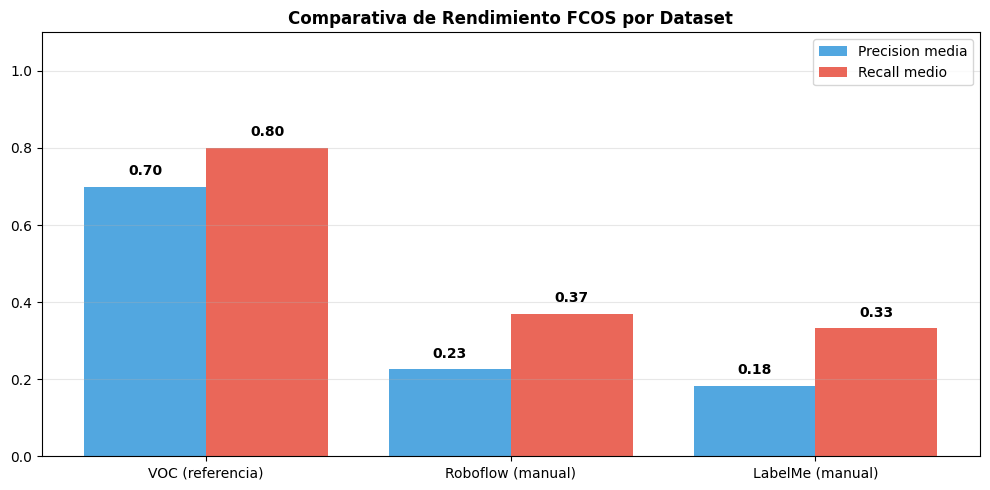

Interpretacion:
  Si VOC > Manual: FCOS funciona mejor en imagenes similares a su entrenamiento
  Si Manual >= VOC: el modelo generaliza muy bien a datos nuevos


In [65]:
datasets_eval = {'VOC (referencia)': (prec_vals, rec_vals)}

if rb_img_map: datasets_eval['Roboflow (manual)'] = (prec_rb, rec_rb)
if lm_jsons:   datasets_eval['LabelMe (manual)']  = (prec_lm, rec_lm)

fig, ax = plt.subplots(figsize=(10, 5))
colors = ['#3498db', '#27ae60', '#e67e22']
x = np.arange(len(datasets_eval))
dataset_names = list(datasets_eval.keys())
mean_prec = [np.mean(v[0]) for v in datasets_eval.values()]
mean_rec  = [np.mean(v[1]) for v in datasets_eval.values()]

ax.bar(x-0.2, mean_prec, 0.4, label='Precision media', color='#3498db', alpha=0.85)
ax.bar(x+0.2, mean_rec,  0.4, label='Recall medio',    color='#e74c3c', alpha=0.85)
ax.set_xticks(x); ax.set_xticklabels(dataset_names)
ax.set_ylim(0, 1.1); ax.legend(); ax.grid(axis='y', alpha=0.3)
ax.set_title('Comparativa de Rendimiento FCOS por Dataset', fontweight='bold')
for i, (p, r) in enumerate(zip(mean_prec, mean_rec)):
    ax.text(i-0.2, p+0.03, f'{p:.2f}', ha='center', fontsize=10, fontweight='bold')
    ax.text(i+0.2, r+0.03, f'{r:.2f}', ha='center', fontsize=10, fontweight='bold')
plt.tight_layout(); plt.show()

print('Interpretacion:')
print('  Si VOC > Manual: FCOS funciona mejor en imagenes similares a su entrenamiento')
print('  Si Manual >= VOC: el modelo generaliza muy bien a datos nuevos')


### 6.4 Que Clases Detecta Mas FCOS?

C:\Users\Usuario\AppData\Local\Temp\ipykernel_18004\1768231252.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_sorted2, rotation=40, ha='right')


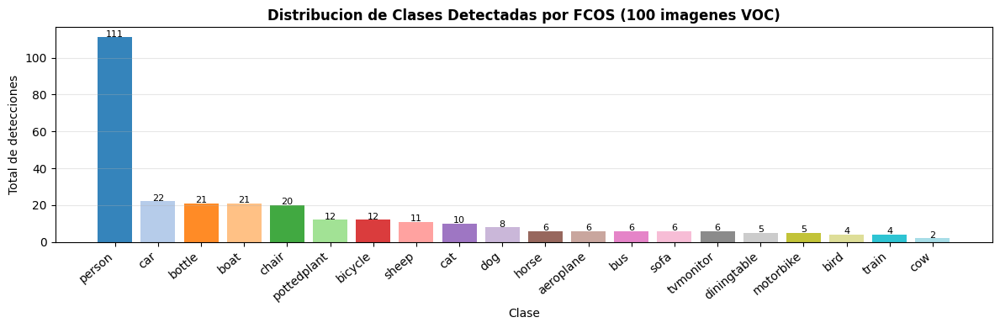

In [57]:
cls_count = defaultdict(int)
random.seed(99)
for idx in random.sample(range(len(voc_dataset)), 100):
    img_i,_ = get_sample_voc(idx, voc_dataset)
    pl,_,_ = predict_fcos(img_i, 0.5)
    for lab in pl: cls_count[classes[lab]] += 1

cls_sorted2 = sorted(cls_count, key=cls_count.get, reverse=True)
counts = [cls_count[c] for c in cls_sorted2]

fig, ax = plt.subplots(figsize=(12, 4))
bars = ax.bar(cls_sorted2, counts,
              color=plt.cm.tab20(np.linspace(0,1,len(cls_sorted2))), alpha=0.9)
ax.set_xlabel('Clase'); ax.set_ylabel('Total de detecciones')
ax.set_title('Distribucion de Clases Detectadas por FCOS (100 imagenes VOC)', fontweight='bold')
ax.set_xticklabels(cls_sorted2, rotation=40, ha='right')
for bar, cnt in zip(bars, counts):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3,
            str(cnt), ha='center', fontsize=8)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.show()
